# Orbit Final

This notebook was adapted from `Orbit_games.ipynb`.



In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

In [2]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

In [3]:
class Orbit:
    """
    Potentials and associated differential equations for central force motion
    with the potential U(r) = k r^n.  Several algorithms for integration of 
    ordinary differential equations are now available. 
    """
    
    def __init__(self, m1=1., m2=1., G=1.):
        """
        This function initializes the masses of the 3 planets (m1, m2, m3) and a gravitational constant (G).
        """
        self.m1 = m1
        self.m2 = m2
#        self.m3 = m3
        self.G = G
        
    def dz_dt(self, t, z):
        """
        This function returns the rhs of the diffeq:
        [dz/dt d^2z/dt^2]
        """
        x1, xd1, y1, yd1, x2, xd2, y2, yd2 = z
#         x3, xd3, y3, yd3
        
        r_12 = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
#        r_23 = np.sqrt((x2 - x3)**2 + (y2 - y3)**2)
#        r_13 = np.sqrt((x1 - x3)**2 + (y1 - y3)**2)
        return [ \
                xd1, self.G * self.m2 * (x2-x1) / r_12**3, \
                yd1, self.G * self.m2 * (y2-y1) / r_12**3, \
                xd2, self.G * self.m1 * (x1-x2) / r_12**3, \
                yd2, self.G * self.m1 * (y1-y2) / r_12**3, \
               ]
    
#     + self.G * self.m3 * (x3-x1) / r_13**3, 
#     + self.G * self.m3 * (y3-y1) / r_13**3,
#     + self.G * self.m3 * (x3-x2) / r_23**3,
#     + self.G * self.m3 * (y3-y2) / r_23**3,
#     xd3, self.G * self.m1 * (x1-x3) / r_13**3 + self.G * self.m2 * (x2-x3) / r_23**3, \
#     yd3, self.G * self.m1 * (y1-y3) / r_13**3 + self.G * self.m2 * (y2-y3) / r_23**3, \
    
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
#         0   1   2    3   4    5   6    7   8    9   10   11
        x1, xd1, y1, yd1, x2, xd2, y2, yd2 = solution.y
        return x1, xd1, y1, yd1, x2, xd2, y2, yd2
        # x3, xd3, y3, yd3
    
#     def solve_ode_Leapfrog(self, t_pts, z_0):
#         """
#         Solve the ODE given initial conditions with the Leapfrog method.
#         """
#         delta_t = t_pts[1] - t_pts[0]
        
#         x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0 = z_0
#         # initialize the arrays for r, rdot, r_dot_half, phi with zeros
#         num_t_pts = len(t_pts)
#         r = np.zeros(num_t_pts)
#         r_dot = np.zeros(num_t_pts)
#         r_dot_half = np.zeros(num_t_pts)
#         phi = np.zeros(num_t_pts)
        
#         # initial conditions
#         r[0] = r_0
#         r_dot[0] = r_dot_0
#         phi[0] = phi_0
        
#         # step through the differential equation
#         for i in np.arange(num_t_pts - 1):
#             t = t_pts[i]
#             y = [r[i], r_dot[i], phi[i]]
#             r_dot_half[i] = r_dot[i] + self.dy_dt(t, y)[1] * delta_t/2.
#             r[i+1] = r[i] + r_dot_half[i] * delta_t
            
#             y = [r[i+1], r_dot[i], phi[i]]
#             r_dot[i+1] = r_dot_half[i] + self.dy_dt(t, y)[1] * delta_t/2.
            
#             phi[i+1] = phi[i] + self.dy_dt(t,y)[2] * delta_t
#         return r, r_dot, phi   
        
    
#     def energy(self, t_pts, r, r_dot):
#         """Evaluate the energy as a function of time"""
#         return (self.mu/2.) * r_dot**2 + self.Ueff(r)

In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Make simple orbit plots

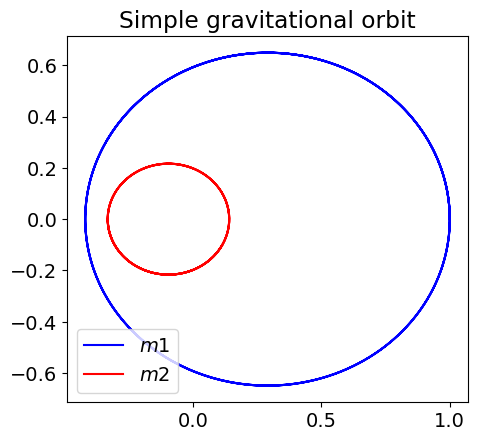

In [6]:
orbit_labels = (r'$x$', r'$y$')

# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

G = 1.
m1 = 1.
m2 = 3.
#m3 = 2.

#Instantiate orbits
o1 = Orbit(m1, m2, G)

# Initial conditions with CoM velocity = 0
x1_0, xd1_0 = 1., 0.
y1_0, yd1_0 = 0., 1.
x2_0, xd2_0 = -(m1/m2) * x1_0, -(m1/m2) * xd1_0
y2_0, yd2_0 = -(m1/m2) * y1_0, -(m1/m2) * yd1_0
# x3_0, xd3_0 = -(m1/m3) * x1_0 - (m2/m3) * x2_0, -(m1/m3) * xd1_0 - (m2/m3) * xd2_0
# y3_0, yd3_0 = -(m1/m3) * y1_0 - (m2/m3) * y2_0, -(m1/m3) * yd1_0 - (m2/m3) * yd2_0

z_0 = [x1_0, xd1_0, y1_0, yd1_0, x2_0, xd2_0, y2_0, yd2_0]
# x3_0, xd3_0, y3_0, yd3_0

x1, xd1, y1, yd1, x2, xd2, y2, yd2 = o1.solve_ode(t_pts, z_0)
# x3, xd3, y3, yd3

#Start plot
fig = plt.figure(figsize=(5,5))

#First plot - orbit
ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x1, y1, color='blue', label=r'$m1$')
ax.plot(x2, y2, color='red', label=r'$m2$')
# ax.plot(x3, y3, color='green', label=r'$m3$')
ax.set_title('Simple gravitational orbit')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()
fig.savefig('simple_orbits.png', bbox_inches='tight')

In [7]:
from matplotlib import animation, rc
from IPython.display import HTML

In [12]:
%%capture

x_min = -0.5
x_max = 1.2
y_min = -1.0
y_max = -y_min

fig_anim = plt.figure(figsize=(5,3), num='Orbits 1')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
ln1_anim, = ax_anim.plot(x1, y1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x2, y2, color='red', lw=1)
# ln3_anim, = ax_anim.plot(x3, y3, color='green', lw=1)

pt1_anim, = ax_anim.plot(x1[0], y1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x2[0], y2[0], 'o', markersize=8, color='red')
# pt3_anim, = ax_anim.plot(x3[0], y3[0], 'o', markersize=8, color='green')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [13]:
def animate_orbits(i):
    """
    FuncAnimation frame indexer
    """
    i_skip = 1 * i
    
    pt1_anim.set_data(x1[i_skip], y1[i_skip])
    pt2_anim.set_data(x2[i_skip], y2[i_skip])
#     pt3_anim.set_data(x3[i_skip], y3[i_skip])
    
    return (pt1_anim, pt2_anim)

In [14]:
frame_interval = 10.
frame_number = 1001
anim = animation.FuncAnimation(fig_anim, 
                               animate_orbits, 
                               init_func=None, 
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True, 
                               repeat=False)

In [15]:
HTML(anim.to_jshtml())